# Abstract:

### Breast cancer represents one of the diseases that make a high number of deaths every year. It is the most common type of all cancers and the main cause of women's deaths worldwide. Classification and data mining methods are an effective way to classify data. Especially in the medical field, where those methods are widely used in diagnosis and analysis to make decisions.

# Problem Statement:

### Given the details of cell nuclei taken from breast mass, predict whether or not a patient has breast cancer using the Ensembling Techniques. Perform necessary exploratory data analysis before building the model and evaluate the model based on performance metrics other than model accuracy.

# Dataset Information:

### The dataset consists of several predictor variables and one target variable, Diagnosis. The target variable has values 'Benign' and 'Malignant', where 'Benign' means that the cells are not harmful or there is no cancer and 'Malignant' means that the patient has cancer and the cells have a harmful effect

# Variable Description:

### radius=Mean of distances from center to points on the perimeter
### texture=Standard deviation of gray-scale values
### perimeter=Observed perimeter of the lump
### area=Observed area of lump
### smoothness=Local variation in radius lengths
### compactness= perimeter^2 / area - 1.0
### concavity =Severity of concave portions of the contour
### concave= points number of concave portions of the contour
### symmetry=Lump symmetry
### fractal dimension ="coastline approximation" - 1
### Diagnosis= Whether the patient has cancer or not? ('Malignant','Benign')

# Import the required packages

In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 

In [2]:
df=pd.read_csv("cancer.csv")  ## loading the dataset

In [3]:
df.head() # reading the first five rows

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [4]:
df.shape # printing number of rows and number of columns

(569, 33)

In [5]:
df.info() #printing all columns ,non null values and datatype

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [6]:
df.isnull().sum() # checking the null values                                      

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [7]:
# there are no null values in dataset

In [8]:
df.describe() # returns the statistical summary  for NUMERICAL DATA


,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [9]:
df.describe(include='all') # returns the statistical summary  for  CATEGORICAL DATA


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
unique,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,357,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,3.037183e+07,NaN,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,NaN,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,NaN,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,NaN,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,NaN,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,NaN,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN


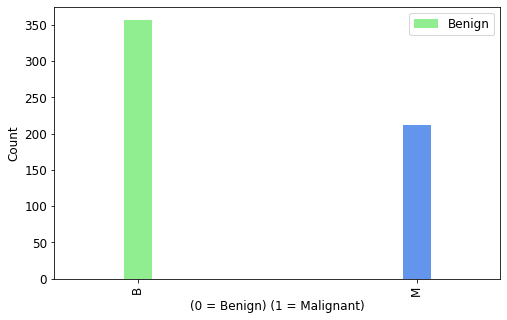

In [10]:
df.diagnosis.value_counts() \
    .plot(kind="bar", width=0.1, color=["lightgreen", "cornflowerblue"], legend=1, figsize=(8, 5))
plt.xlabel("(0 = Benign) (1 = Malignant)", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(fontsize=12);
plt.yticks(fontsize=12)
plt.legend(["Benign"], fontsize=12)
plt.show()

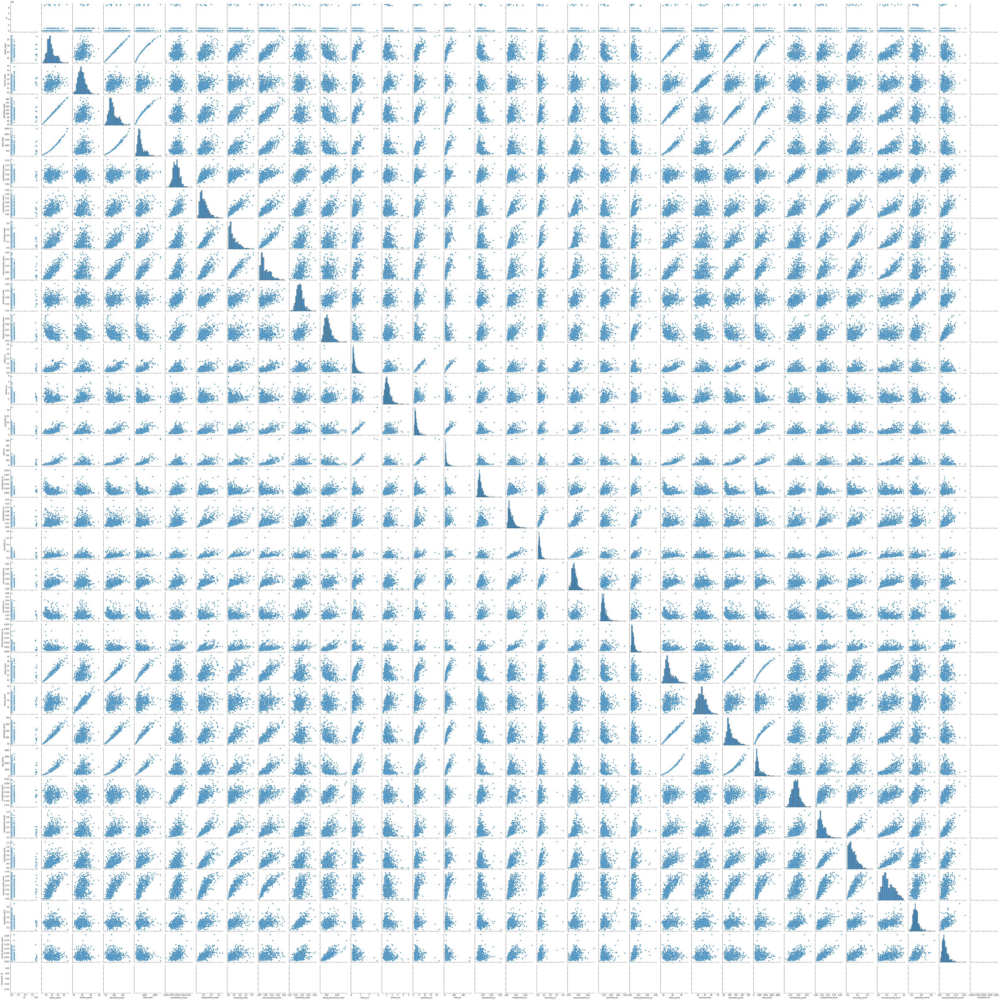

In [11]:
sns.pairplot(df)

<AxesSubplot:>

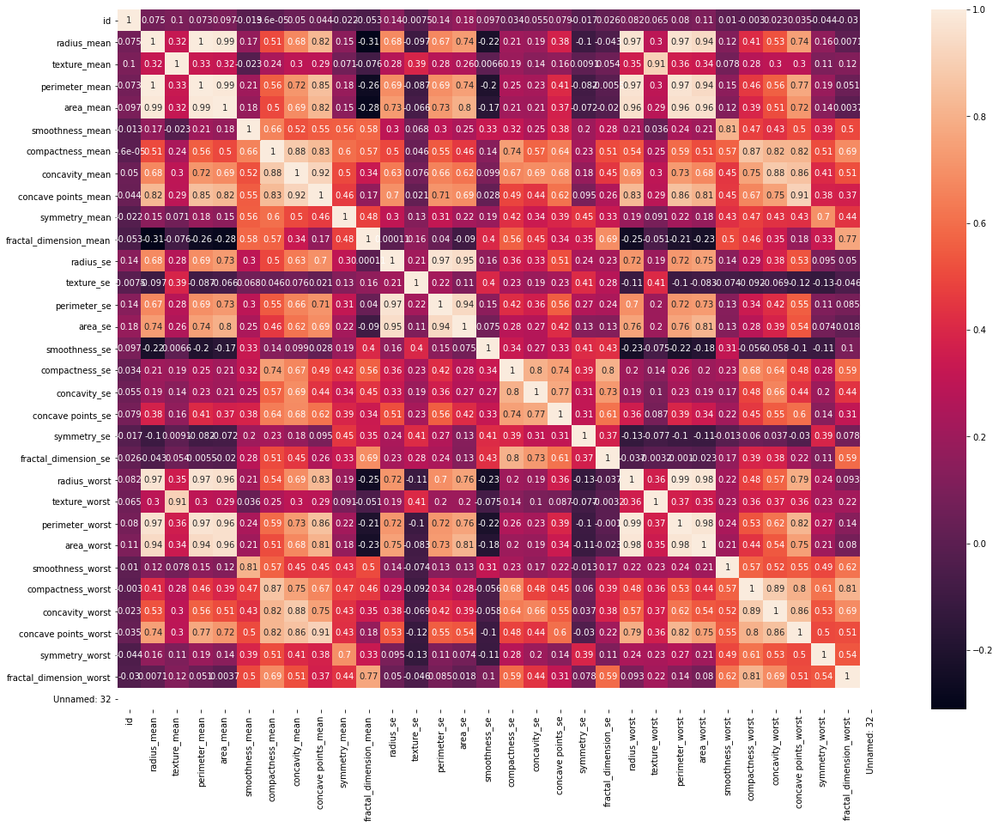

In [12]:
plt.figure(figsize=(20,15))

sns.heatmap(df.corr(),annot=True)


In [ ]:
#converting  diagnosis column into numerical by using mapping 

In [11]:
df['diagnosis']=df['diagnosis'].map({'B':0,'M':1})

In [12]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
# finding the outliers using box plot

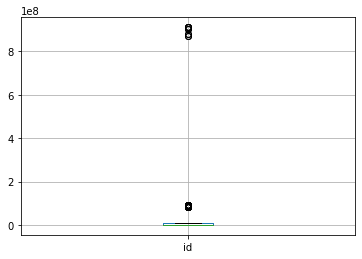

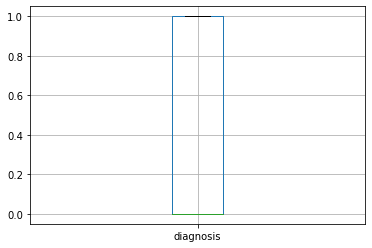

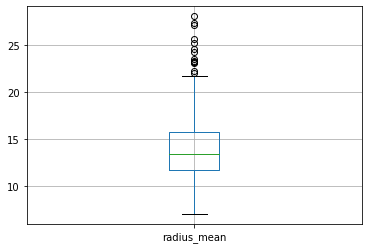

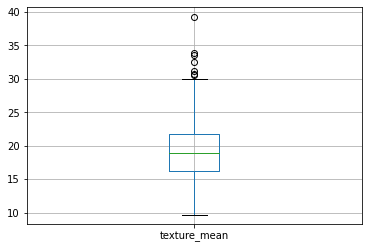

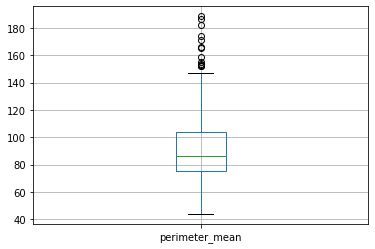

...

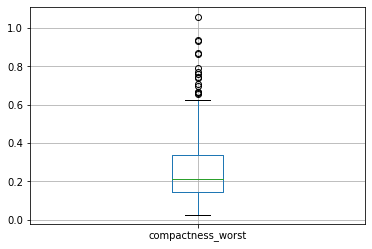

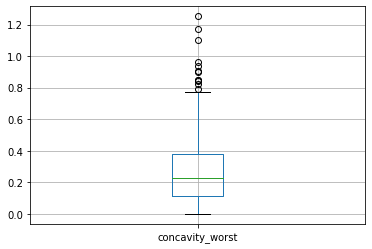

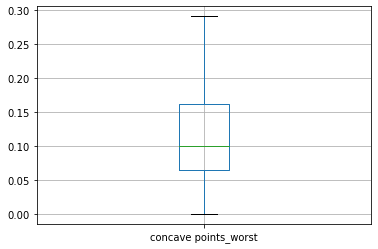

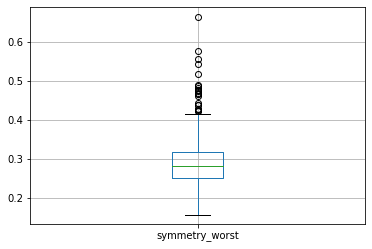

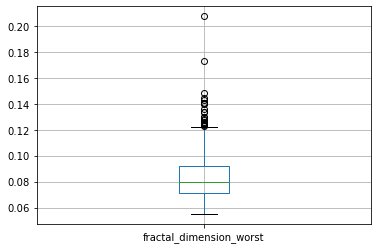

In [13]:
for column in df:
    plt.figure()
    df.boxplot([column])
    plt.show()

In [ ]:
# treating the outliers using iqr

In [14]:
from numpy import percentile


Percentiles: 25th=869218.000, 75th=8813129.000, IQR=7943911.000
Identified outliers: 81
Non-outlier observations: 488


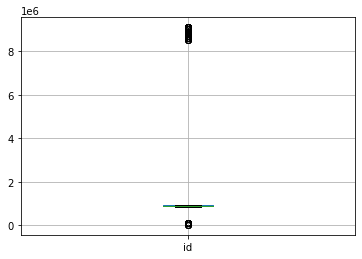

Percentiles: 25th=0.000, 75th=1.000, IQR=1.000
Identified outliers: 0
Non-outlier observations: 488


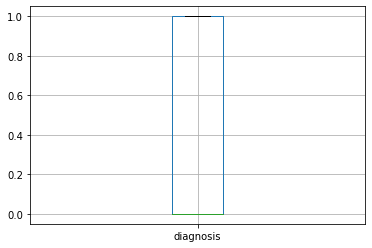

Percentiles: 25th=11.638, 75th=15.702, IQR=4.065
Identified outliers: 11
Non-outlier observations: 477


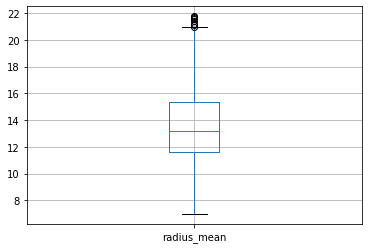

Percentiles: 25th=16.020, 75th=21.570, IQR=5.550
Identified outliers: 3
Non-outlier observations: 474


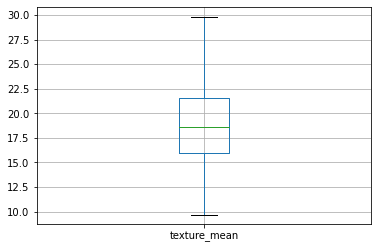

Percentiles: 25th=74.333, 75th=101.925, IQR=27.592
Identified outliers: 3
Non-outlier observations: 471


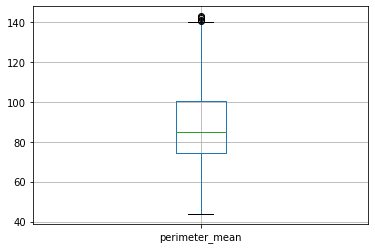

Percentiles: 25th=408.950, 75th=722.500, IQR=313.550
Identified outliers: 28
Non-outlier observations: 443


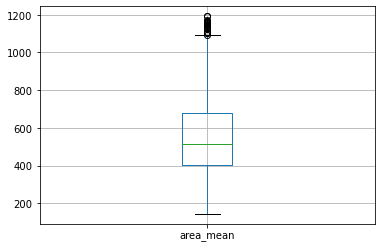

Percentiles: 25th=0.085, 75th=0.104, IQR=0.019
Identified outliers: 5
Non-outlier observations: 438


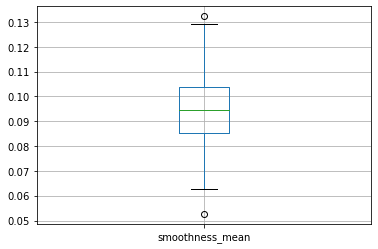

Percentiles: 25th=0.061, 75th=0.122, IQR=0.061
Identified outliers: 13
Non-outlier observations: 426


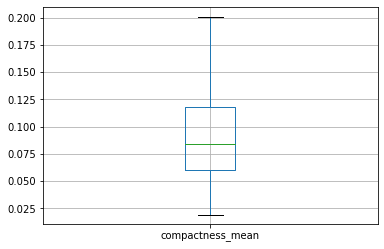

Percentiles: 25th=0.026, 75th=0.099, IQR=0.073
Identified outliers: 11
Non-outlier observations: 415


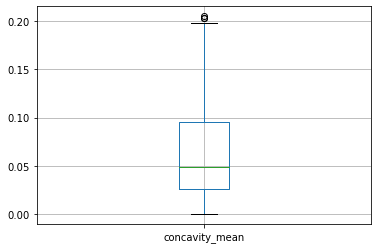

Percentiles: 25th=0.019, 75th=0.053, IQR=0.035
Identified outliers: 4
Non-outlier observations: 411


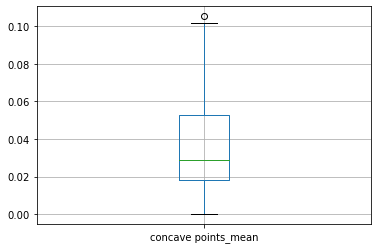

Percentiles: 25th=0.160, 75th=0.193, IQR=0.032
Identified outliers: 6
Non-outlier observations: 405


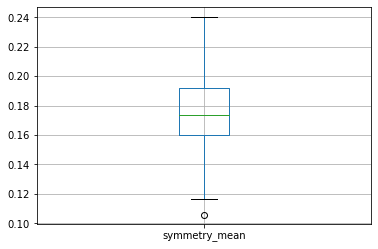

Percentiles: 25th=0.058, 75th=0.066, IQR=0.008
Identified outliers: 8
Non-outlier observations: 398


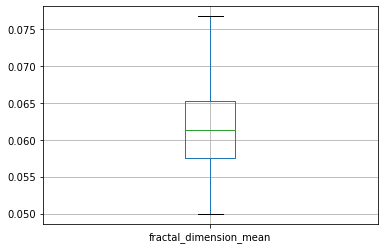

Percentiles: 25th=0.221, 75th=0.392, IQR=0.171
Identified outliers: 19
Non-outlier observations: 379


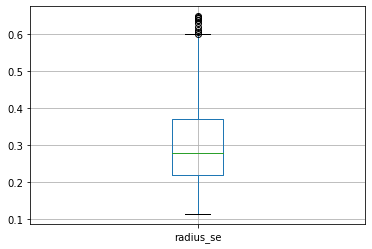

Percentiles: 25th=0.815, 75th=1.458, IQR=0.644
Identified outliers: 14
Non-outlier observations: 365


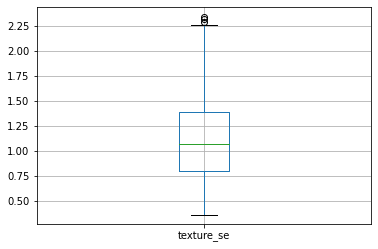

Percentiles: 25th=1.509, 75th=2.577, IQR=1.068
Identified outliers: 10
Non-outlier observations: 355


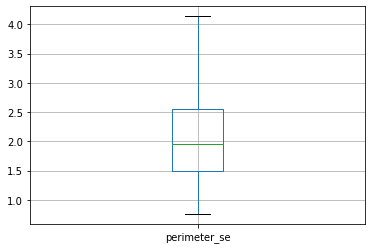

Percentiles: 25th=16.390, 75th=28.565, IQR=12.175
Identified outliers: 22
Non-outlier observations: 333


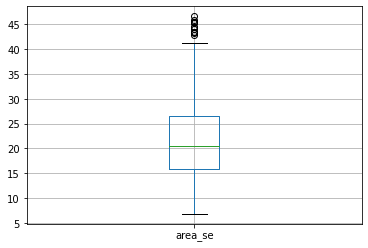

Percentiles: 25th=0.005, 75th=0.008, IQR=0.003
Identified outliers: 13
Non-outlier observations: 320


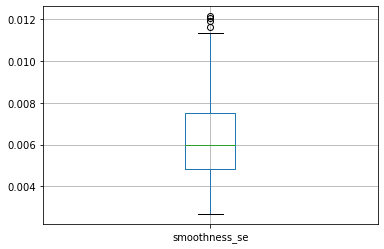

Percentiles: 25th=0.012, 75th=0.025, IQR=0.013
Identified outliers: 12
Non-outlier observations: 308


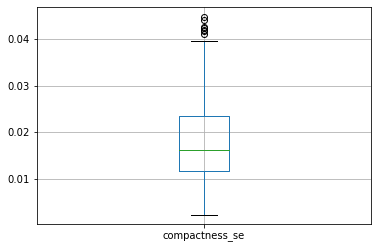

Percentiles: 25th=0.013, 75th=0.030, IQR=0.016
Identified outliers: 7
Non-outlier observations: 301


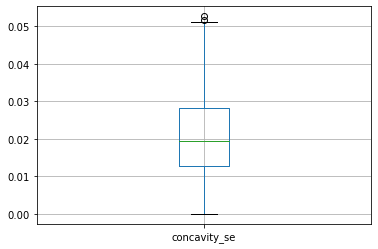

Percentiles: 25th=0.007, 75th=0.012, IQR=0.005
Identified outliers: 3
Non-outlier observations: 298


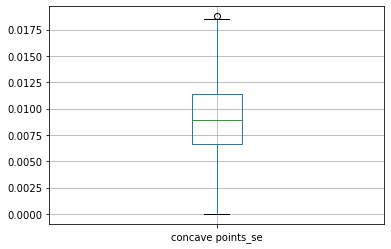

Percentiles: 25th=0.015, 75th=0.021, IQR=0.007
Identified outliers: 10
Non-outlier observations: 288


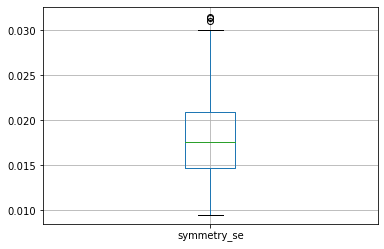

Percentiles: 25th=0.002, 75th=0.004, IQR=0.002
Identified outliers: 7
Non-outlier observations: 281


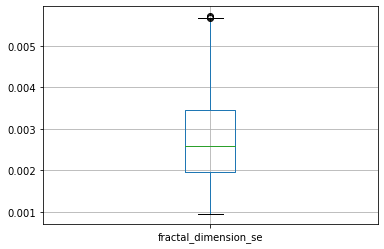

Percentiles: 25th=13.030, 75th=15.930, IQR=2.900
Identified outliers: 6
Non-outlier observations: 275


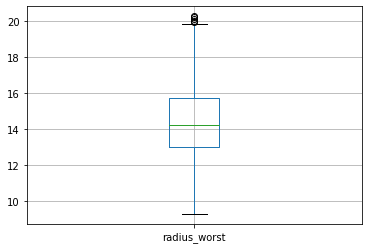

Percentiles: 25th=20.295, 75th=28.375, IQR=8.080
Identified outliers: 1
Non-outlier observations: 274


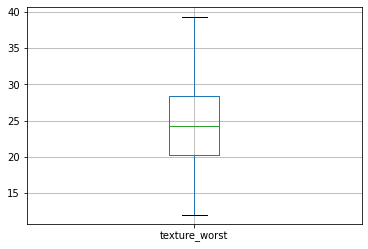

Percentiles: 25th=83.703, 75th=102.875, IQR=19.173
Identified outliers: 3
Non-outlier observations: 271


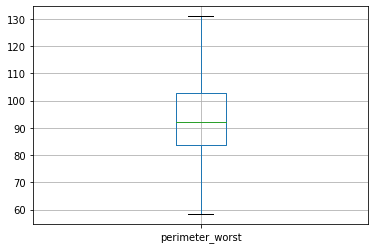

Percentiles: 25th=513.950, 75th=750.050, IQR=236.100
Identified outliers: 7
Non-outlier observations: 264


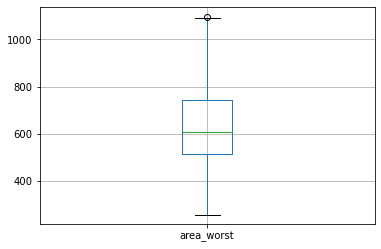

Percentiles: 25th=0.113, 75th=0.141, IQR=0.029
Identified outliers: 2
Non-outlier observations: 262


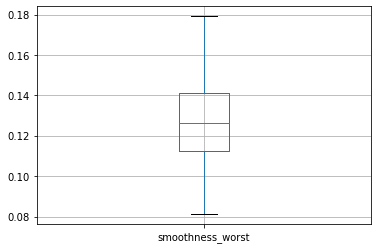

Percentiles: 25th=0.124, 75th=0.236, IQR=0.112
Identified outliers: 16
Non-outlier observations: 246


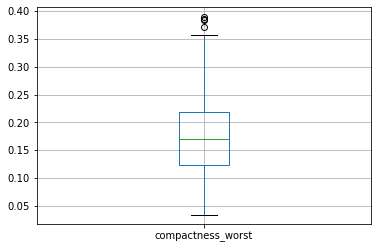

Percentiles: 25th=0.085, 75th=0.225, IQR=0.140
Identified outliers: 3
Non-outlier observations: 243


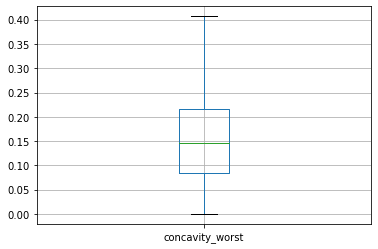

Percentiles: 25th=0.057, 75th=0.099, IQR=0.042
Identified outliers: 1
Non-outlier observations: 242


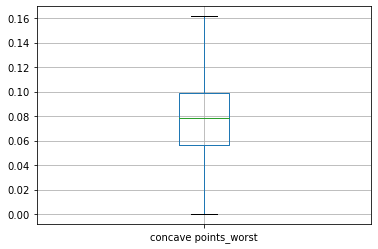

Percentiles: 25th=0.245, 75th=0.301, IQR=0.056
Identified outliers: 1
Non-outlier observations: 241


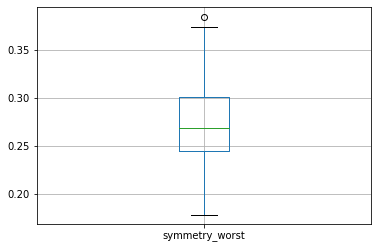

Percentiles: 25th=0.070, 75th=0.083, IQR=0.013
Identified outliers: 4
Non-outlier observations: 237


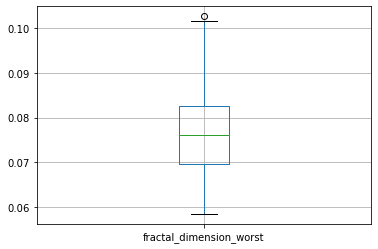

In [15]:
for column in df.columns:
    q25, q75 = percentile(df[column], 25), percentile(df[column], 75)
    iqr = q75 - q25
    print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (q25, q75, iqr))
    # calculate the outlier cutoff
    cut_off = iqr * 1.5
    lower, upper = q25 - cut_off, q75 + cut_off
    # identify outliers
    outliers = [x for x in df[column] if x < lower or x > upper]
    print('Identified outliers: %d' % len(outliers))
    # remove outliers
    outliers_removed = [x for x in df[column] if x >= lower and x <= upper]
    print('Non-outlier observations: %d' % len(outliers_removed))
    df = df[df[column] < upper]
    plt.figure()
    df.boxplot([column])
    plt.show()

In [16]:
df.diagnosis.value_counts()

0    221
1     16
Name: diagnosis, dtype: int64

# MODELS

# AdaBoostClassifier

In [17]:
import sklearn
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics




In [18]:
X=df.drop(['diagnosis'],axis=1)
y=df[['diagnosis']]

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=0) 


In [20]:
abc = AdaBoostClassifier(n_estimators=50,
                         learning_rate=1)
# Train Adaboost Classifer
model = abc.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = model.predict(X_test)

C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


In [21]:
model.score(X_train, y_train)

1.0

In [22]:
model.score(X_test, y_test)

0.9444444444444444

In [23]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


Accuracy: 0.9444444444444444


In [ ]:
# training score- 1.0
# testing score- 0.9444444444444444

# BaggingClassifier

In [24]:
from sklearn.tree import DecisionTreeClassifier

In [25]:
dTree = DecisionTreeClassifier(criterion = 'gini', random_state=0)
dTree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [26]:
 from sklearn.ensemble import BaggingClassifier


In [27]:
X=df.drop(['diagnosis'],axis=1)
y=df[['diagnosis']]

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=0) 


In [29]:
bgcl = BaggingClassifier( n_estimators=50,base_estimator=dTree,random_state=1)
bgcl = bgcl.fit(X_train, y_train)
y_predict = bgcl.predict(X_test)
print(bgcl.score(X_test , y_test))

C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


0.9444444444444444


In [30]:
bgcl.score(X_train, y_train)

0.9939393939393939

In [31]:
bgcl.score(X_test, y_test)

0.9444444444444444

In [ ]:
# training score- 0.9939393939393939
# testing score-0.9444444444444444

# GradientBoostingClassifier

In [32]:
X=df.drop(['diagnosis'],axis=1)
y=df[['diagnosis']]

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=0) 


In [34]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50,random_state=1)
gbcl = gbcl.fit(X_train, y_train)
y_predict = gbcl.predict(X_test)
print(gbcl.score(X_test, y_test))

C:\Users\LENOVO\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


0.9166666666666666


In [35]:
gbcl.score(X_train, y_train)

1.0

In [36]:
gbcl.score(X_test, y_test)

0.9166666666666666

In [ ]:
# training score- 1.0
# testing score - 0.9166666666666666

# RandomForestClassifier

In [37]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50, random_state=1,max_features=12)
rfcl = rfcl.fit(X_train, y_train)

<ipython-input-37-a2a8989d2bfc>:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfcl = rfcl.fit(X_train, y_train)


In [38]:
y_predict = rfcl.predict(X_test)


In [39]:
rfcl.score(X_train, y_train)

0.9939393939393939

In [40]:
rfcl.score(X_test, y_test)

0.9305555555555556

In [ ]:
# training score- 0.9939393939393939
# testing score - 0.9305555555555556